# Engineer in data and machine learning for film analysis with data-centric AI

**Name:** Ufuk Cem Birbiri

**Email:** ufuk.birbiri@gmail.com

**Phone:** +33 (0)6 29 25 78 49

Your task is to:
- write a python program that will



1.   Generate an output video with (as for example in Fig. 1, suggested tool/library usage: ffmpeg, opencv):

  *   bounding boxes around the head (facial organs not including neck) and
upper body (neck to hip)
  *   lines that show the articulation of the limbs (arms from the shoulder to
elbow, elbow to wrist, legs from hip to knee, knee to ankle)


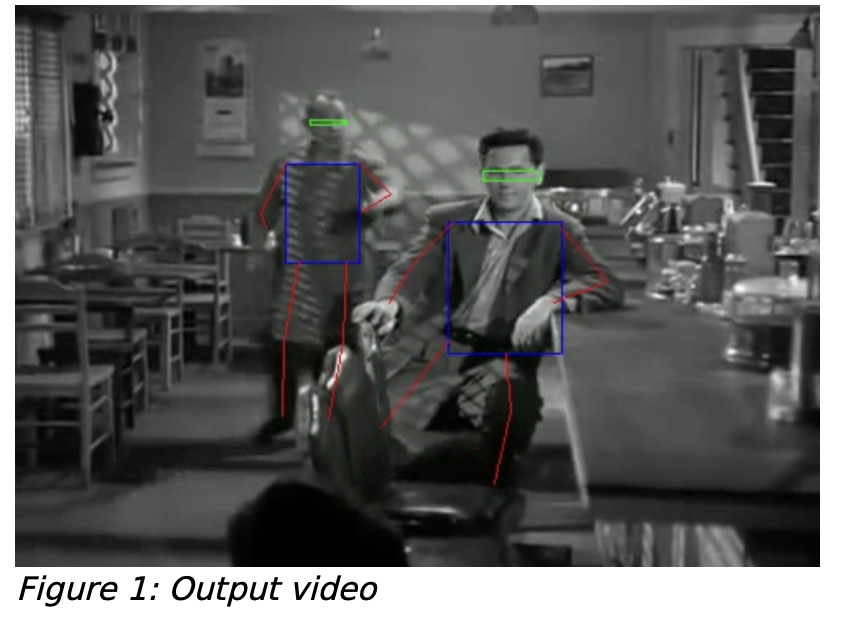



2.   output the information as tabular data in a CSV file. Each row should use comma
delimiters to separate values for :


  *  (a) **Frame and person IDs:** 'frame_ID','person_ID',
  *  (b) **Head bounding box center coordinates, width, and height:** 'head_center_x',
'head_center_y', 'head_width', 'head_height',
  *  (c) **Upper body bounding box center coordinates, width, and height:**
'body_center_x', 'body_center_y', 'body_width', 'body_height'
  *  (d) **Left and right shoulder coordinates with a unit vector (i.e. length of vector is 1) that points towards elbow and length parameter, and unit vector that points from elbow
towards wrist with length parameter:** 'left_shoulder_x', 'left_shoulder_y',
'left_shoulder_vec_x', 'left_shoulder_vec_y', 'left_upper_arm_length','left_elbow_vec_x',
'left_elbow_vec_y', 'left_lower_arm_length', 'right_shoulder_x',
'right_shoulder_y','right_shoulder_vec_x', 'right_shoulder_vec_y',
'right_upper_arm_length','right_elbow_vec_x', 'right_elbow_vec_y',
'right_lower_arm_length',
  *  (e) **Similarly to d. and e., for the left/right hip to knee, and the knee to ankle:**
'left_hip_x', 'left_hip_y','left_hip_vec_x', 'left_hip_vec_y',
'left_upper_leg_length','left_knee_vec_x', 'left_knee_vec_y',
'left_lower_leg_length','right_hip_x', 'right_hip_y','right_hip_vec_x', 'right_hip_vec_y',
'right_upper_leg_length','right_knee_vec_x', 'right_knee_vec_y', 'right_lower_leg_length'





If a value is missing, it should be set to -1.

- comment and document your code so that it is easily reusable
- your code should be as generic as possible to deal with all similarly named and formatted
video-json file pairs

I am using Google Colab and I have put the data to my Drive to extract from there easily.

In [ ]:
#Connect Drive to Colab
from google.colab import drive
from matplotlib import pyplot as plt
drive.mount('/content/drive')

Mounted at /content/drive


In this project, there are 3 parts:

1.   Data Exploration:

    *   Divide the video into frames and investigate the JSON file
    *   Plot the key points on an example face frame and draw the bounding box
    *   Plot the key points of the body on an example frame and draw the bounding box.
    *   Draw the lines of arms and legs


2.   Pipeline

    *   Create functions for unit vector calculation, drawing bounding boxes and lines
    *   Drawing bounding boxes to face and body, and plot lines for arms and legs for each frame.
    *  Calculate unit vectors and create a .csv file

3.   Create a video from Frames
    *  Create a video from the final frames






# 1. Data Exploration

Extract the video frames from the sample video using OpenCV.

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import json


def extract_frames(video_path):
  print('Extracting video frames...')
  #1. Extract video frames save them as .jpg format
  #Arguments:
    # video_path: file path of the video
  #Return: frames_jpg: list of video frames in .jpg format

  #Read the video using OpenCV
  capture = cv2.VideoCapture(video_path)
  frameNr = 0
  #create a list to save the frames
  frames_jpg = []
  while (True):
    success, image = capture.read()
    if success:
      #Save the jpg image in a list
      frames_jpg.append(image)
    else:
      break
    frameNr = frameNr+1
    #print(frameNr)
  capture.release()
  return frames_jpg

#path of the example video
video_path = "/content/drive/MyDrive/Prof-Lucile-Sassatelli-project/clip_05.mp4"
video_frames_jpg = extract_frames(video_path)


Extracting video frames...


In [ ]:
print('Total number of frames in the video = ',len(video_frames_jpg))
print('Type of the video frames = ', type(video_frames_jpg[0]))
print('Shape of the video frames = ',video_frames_jpg[0].shape)

Total number of frames in the video =  1864
Type of the video frames =  <class 'numpy.ndarray'>
Shape of the video frames =  (360, 498, 3)


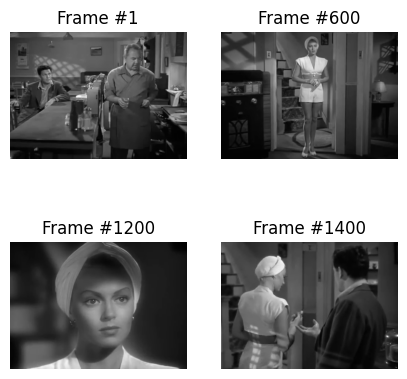

In [ ]:

def display_some_frames(frame_list, video_frames_jpg):
  #Display 4 of selected frames
  #Arguments:
      #frame_list: list of frame numbers to display.
      #video_frames_jpg: list of video frames in .jpg format.

  import cv2
  from matplotlib import pyplot as plt
  # create figure
  fig = plt.figure(figsize=(5, 5))
  # setting values to rows and column variables
  rows = 2
  columns = 2

  count = 1
  for frame in frame_list:
    IMAGE = video_frames_jpg[frame]
    # Adds a subplot at the 1st position
    fig.add_subplot(rows, columns, count)
    # showing image
    plt.imshow(IMAGE)
    plt.axis('off')
    plt.title("Frame #"+str(frame))
    count +=1

  plt.show()


display_some_frames([1, 600, 1200, 1400], video_frames_jpg)

Now, let's investigate the **clip_05_pose.json** file.

In [ ]:
import json

#Read the json file
json_file_path = "/content/drive/MyDrive/Prof-Lucile-Sassatelli-project/clip_05_pose.json"
json_video_clip = open(json_file_path)
json_video_dict = json.load(json_video_clip)

print('Type of the json video file = ',type(json_video_dict))
print(json_video_dict.keys())

Type of the json video file =  <class 'dict'>
dict_keys(['pose_kpts_id', 'toolname', 'frames', 'params', 'command'])


Let's see the index of body parts

In [ ]:
print('Index of body parts:')
json_video_dict['pose_kpts_id']

Index of body parts:


{'0': 'Nose',
 '1': 'Neck',
 '2': 'RShoulder',
 '3': 'RElbow',
 '4': 'RWrist',
 '5': 'LShoulder',
 '6': 'LElbow',
 '7': 'LWrist',
 '8': 'MidHip',
 '9': 'RHip',
 '10': 'RKnee',
 '11': 'RAnkle',
 '12': 'LHip',
 '13': 'LKnee',
 '14': 'LAnkle',
 '15': 'REye',
 '16': 'LEye',
 '17': 'REar',
 '18': 'LEar',
 '19': 'LBigToe',
 '20': 'LSmallToe',
 '21': 'LHeel',
 '22': 'RBigToe',
 '23': 'RSmallToe',
 '24': 'RHeel',
 '25': 'Background'}

Print the keys of this dictionary one-by-one to see what is inside.

In [ ]:
#Display one example frame:
print(json_video_dict['frames'].keys())
print('There are',len(list(json_video_dict['frames'].keys())), 'frames in json video file.')
print('\n')
print(json_video_dict['frames']['1'].keys())
print(json_video_dict['frames']['1']['person_00'].keys(),'\n')
print('face_kpts = ',json_video_dict['frames']['1']['person_00']['face_kpts'].keys())
print('Number of points in face_kpts = ',len(list(json_video_dict['frames']['1']['person_00']['face_kpts'].keys())))
print('\n')
print('pose_kpts = ',json_video_dict['frames']['1']['person_00']['pose_kpts'].keys())
print('Number of points in pose_kpts = ',len(list(json_video_dict['frames']['1']['person_00']['pose_kpts'].keys())))
print('\n')
json_video_dict['frames']['1']['person_00']['pose_kpts']['0']

dict_keys(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', 

[106.191, 128.613, 0.928549]

## 1.1 Bounding box of face

There are a total of 70 keypoints for the face. We will plot these key points as blue on frame #1200 to see the distribution of the points.

---



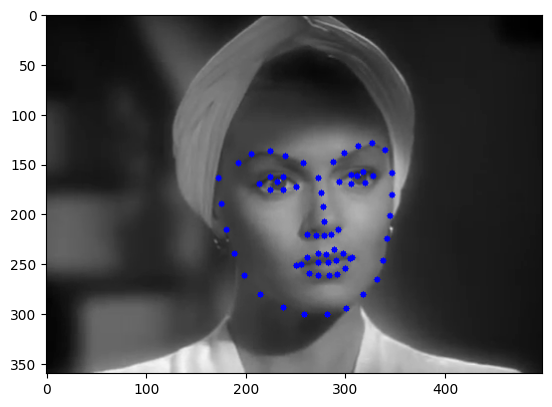

In [ ]:
import cv2

#Copy the frame #1200
frame_1200 = video_frames_jpg[1200].copy()
for i in range(len(json_video_dict['frames']['1']['person_00']['face_kpts'].keys())):

  #Select the x and y coordinates
  x = json_video_dict['frames']['1200']['person_00']['face_kpts'][str(i)][0]
  y = json_video_dict['frames']['1200']['person_00']['face_kpts'][str(i)][1]

  #Plot the keypoints on the image as blue
  frame_1200 = cv2.circle(frame_1200, (int(x), int(y)), radius=0, color=(0, 0, 255), thickness=5)


plt.imshow(frame_1200)


Now we need to find the center key point of the face. After several tries, I found that key point #33 is at the center. Let's plot it as red and see if it is in the center.

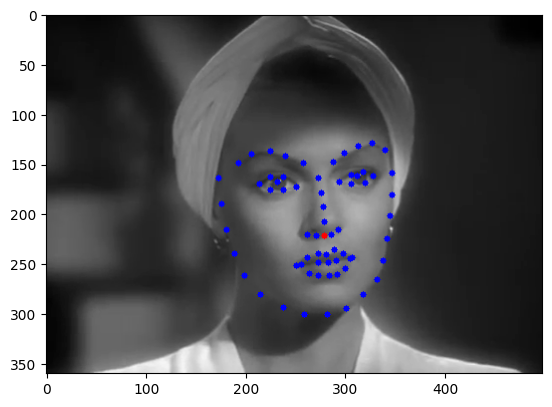

In [ ]:
head_center_x = json_video_dict['frames']['1200']['person_00']['face_kpts']['33'][0]
head_center_y = json_video_dict['frames']['1200']['person_00']['face_kpts']['33'][1]
frame_1200 = cv2.circle(frame_1200, (int(head_center_x), int(head_center_y)), radius=0, color=(255, 0, 0), thickness=5)

plt.imshow(frame_1200)



Yes, the keypoint #33 is the center of the face. We will use this keypoint to plot the bounding box later. Now, let's find the endmost points on the left and right to find the width of the bounding box. Let's try keypoint 16 and 0, and plot them to green.

The width of the head is  173


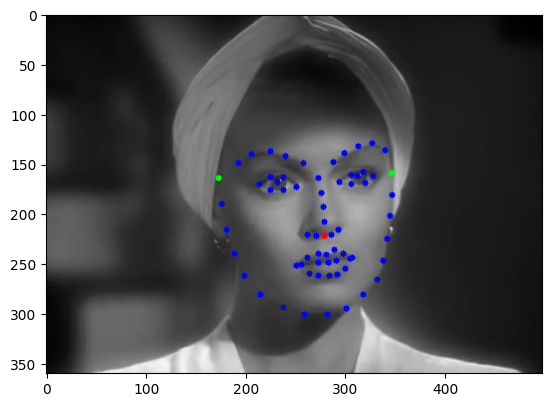

In [ ]:
#Key point #16
endmost_right_x = json_video_dict['frames']['1200']['person_00']['face_kpts']['16'][0]
endmost_right_y = json_video_dict['frames']['1200']['person_00']['face_kpts']['16'][1]
frame_1200 = cv2.circle(frame_1200, (int(endmost_right_x), int(endmost_right_y)), radius=0, color=(0, 255, 0), thickness=5)

#Key point #0
endmost_left_x = json_video_dict['frames']['1200']['person_00']['face_kpts']['0'][0]
endmost_left_y = json_video_dict['frames']['1200']['person_00']['face_kpts']['0'][1]
frame_1200 = cv2.circle(frame_1200, (int(endmost_left_x), int(endmost_left_y)), radius=0, color=(0, 255, 0), thickness=5)

plt.imshow(frame_1200)

width_head = int(np.absolute(endmost_left_x - endmost_right_x))
print("The width of the head is ", width_head)

Find the endmost points on top and bottom to find the height of the bounding box. The keypoints #24 and #8 are the bottom and top points. Let's plot them in white.

The height of the head is  168


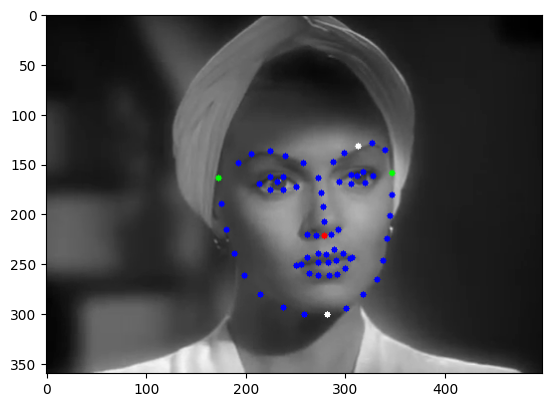

In [ ]:
#Key point #24
endmost_top_x = json_video_dict['frames']['1200']['person_00']['face_kpts']['24'][0]
endmost_top_y = json_video_dict['frames']['1200']['person_00']['face_kpts']['24'][1]
frame_1200 = cv2.circle(frame_1200, (int(endmost_top_x), int(endmost_top_y)), radius=0, color=(255, 255, 255), thickness=5)

#Key point #8
endmost_bottom_x = json_video_dict['frames']['1200']['person_00']['face_kpts']['8'][0]
endmost_bottom_y = json_video_dict['frames']['1200']['person_00']['face_kpts']['8'][1]
frame_1200 = cv2.circle(frame_1200, (int(endmost_bottom_x), int(endmost_bottom_y)), radius=0, color=(255, 255, 255), thickness=5)

plt.imshow(frame_1200)

height_head = int(np.absolute(endmost_top_y - endmost_bottom_y))
print("The height of the head is ", height_head)

Now we can plot the bounding box of the face.

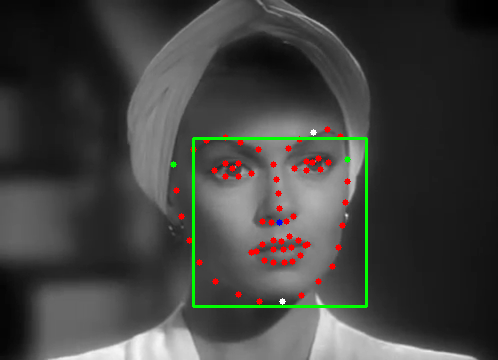

In [ ]:
from google.colab.patches import cv2_imshow

# Start coordinate represents the top left corner of rectangle
start_point = ( int(head_center_x - (width_head/2)) ,  int(head_center_y + (height_head/2) )  )

# Ending coordinate represents the bottom right corner of rectangle
end_point = ( int( head_center_x + (width_head/2)) , int( head_center_y - (height_head/2))   )

color = (0, 255, 0)

# Line thickness of 2 px
thickness = 2

frame_1200_temp = frame_1200.copy()
# Using cv2.rectangle() method
# Draw a rectangle with blue line borders of thickness of 2 px
frame_1200_temp = cv2.rectangle(frame_1200_temp, start_point, end_point, color, thickness)

# Displaying the image
cv2_imshow(frame_1200_temp)

The bounding box of the face works correctly.

## 1.2 Bounding box of the body

There are a total of 25 keypoints for the pose. Some of these points represent joints(feet, elbow, etc.), and some of them represent the body. We will plot these keypoints as blue on frame #600 to see the distribution of the points.

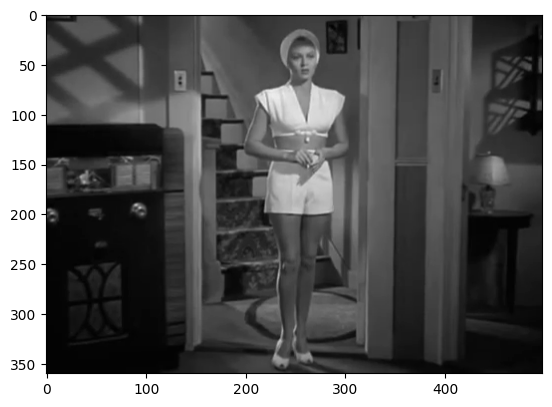

In [ ]:
xx0 = video_frames_jpg[600].copy()
plt.imshow(xx0)


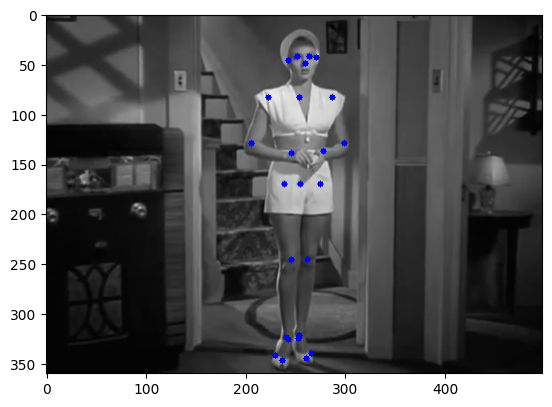

In [ ]:
import cv2

#Copy the frame #1200
frame_600 = video_frames_jpg[600].copy()
for i in range(len(json_video_dict['frames']['600']['person_00']['pose_kpts'].keys())):

  #Select the x and y coordinates
  x = json_video_dict['frames']['600']['person_00']['pose_kpts'][str(i)][0]
  y = json_video_dict['frames']['600']['person_00']['pose_kpts'][str(i)][1]

  #Plot the keypoints on the image as blue
  frame_600 = cv2.circle(frame_600, (int(x), int(y)), radius=0, color=(0, 0, 255), thickness=5)


plt.imshow(frame_600)


Now we need to find the center keypoint of the body and plot it in white.

The coordinates of the body center =  (254, 127)


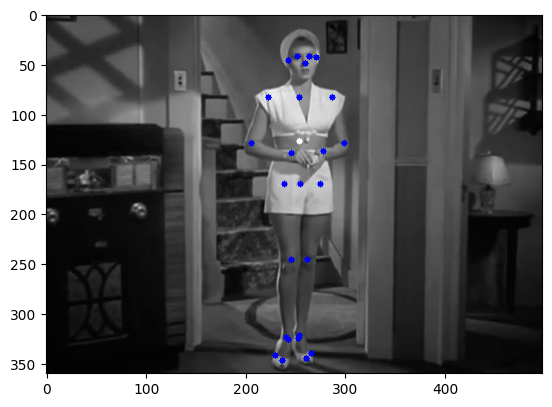

In [ ]:
#The keypoint #1 is at the center and we can use its x-coordinate as body center x-coordinate.
body_center_x = json_video_dict['frames']['600']['person_00']['pose_kpts']['1'][0]

#The body center y-coordinate is the half distance between y-coordinates of the the endmost top(#1) and endmost bottom(#8) points:
body_endmost_top_y = json_video_dict['frames']['600']["person_00"]['pose_kpts']['1'][1]
body_endmost_bottom_y = json_video_dict['frames']['600']["person_00"]['pose_kpts']['8'][1]
body_center_y = (body_endmost_top_y + body_endmost_bottom_y)/2

frame_600 = cv2.circle(frame_600, (int(body_center_x), int(body_center_y)), radius=0, color=(255, 255, 255), thickness=5)

plt.imshow(frame_600)
print('The coordinates of the body center = ', (int(body_center_x), int(body_center_y)))

The height of the body is the distance between the y-coordinates of the endmost top(#1) and bottom(#8) points.

In [ ]:
# body_height:
body_height = int(body_endmost_bottom_y - body_endmost_top_y)
body_height

87


The width of the body is the distance between the x-coordinates of the endmost right and endmost left points.

In [ ]:
#Body width is the difference between the x-coordinates of the endmost right and left keypoints:
body_endmost_right_x = json_video_dict['frames']['600']["person_00"]['pose_kpts']['5'][0]
body_endmost_left_x = json_video_dict['frames']['600']["person_00"]['pose_kpts']['2'][0]

body_width = int(body_endmost_right_x - body_endmost_left_x)
print(body_width)

63


Now we can plot the bounding box of the body.

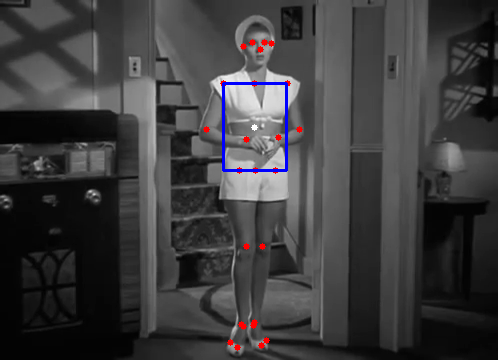

In [ ]:
from google.colab.patches import cv2_imshow

# Start coordinate represents the top left corner of rectangle
start_point = ( int(body_center_x - (body_width/2)) ,  int(body_center_y + (body_height/2) )  )

# Ending coordinate represents the bottom right corner of rectangle
end_point = ( int( body_center_x + (body_width/2)) , int( body_center_y - (body_height/2))   )

color = (255, 0, 0)

# Line thickness of 2 px
thickness = 2

frame_600_temp = frame_600.copy()
# Using cv2.rectangle() method
# Draw a rectangle with blue line borders of thickness of 2 px
frame_600_temp = cv2.rectangle(frame_600_temp, start_point, end_point, color, thickness)

# Displaying the image
cv2_imshow(frame_600_temp)

The bounding box of the body works correctly.

## 1.3 Plot Arms and Legs

Let's remember the index of body parts

In [ ]:
print('Index of body parts:')
json_video_dict['pose_kpts_id']

Index of body parts:


{'0': 'Nose',
 '1': 'Neck',
 '2': 'RShoulder',
 '3': 'RElbow',
 '4': 'RWrist',
 '5': 'LShoulder',
 '6': 'LElbow',
 '7': 'LWrist',
 '8': 'MidHip',
 '9': 'RHip',
 '10': 'RKnee',
 '11': 'RAnkle',
 '12': 'LHip',
 '13': 'LKnee',
 '14': 'LAnkle',
 '15': 'REye',
 '16': 'LEye',
 '17': 'REar',
 '18': 'LEar',
 '19': 'LBigToe',
 '20': 'LSmallToe',
 '21': 'LHeel',
 '22': 'RBigToe',
 '23': 'RSmallToe',
 '24': 'RHeel',
 '25': 'Background'}

Plot the arms according to x and y-coordinates of elbows, wrists and shoulders.

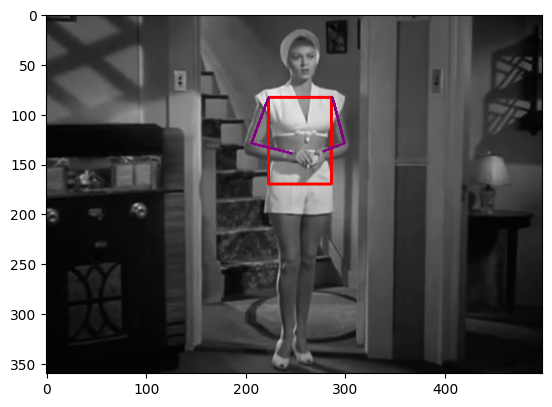

In [ ]:
########### ARMS ###########

#2: RShoulder
RShoulder =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['2'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['2'][1]) ]
#3: RElbow
RElbow =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['3'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['3'][1]) ]
#4: RWrist
RWrist =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['4'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['4'][1] )]

#5: LShoulder
LShoulder =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['5'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['5'][1]) ]
#6: LElbow
LElbow =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['6'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['6'][1] )]
#7: LWrist
LWrist =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['7'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['7'][1]) ]

### Draw the lines ####
# RShoulder --> RElbow
cv2.line(frame_600_temp, RShoulder, RElbow, (128, 0, 128), 2)
# RElbow --> RWrist
cv2.line(frame_600_temp, RElbow, RWrist, (128, 0, 128), 2)

# LShoulder --> LElbow
cv2.line(frame_600_temp, LShoulder, LElbow, (128, 0, 128), 2)
# LElbow --> LWrist
cv2.line(frame_600_temp, LElbow, LWrist, (128, 0, 128), 2)
plt.imshow(frame_600_temp)

Now, plot the legs.

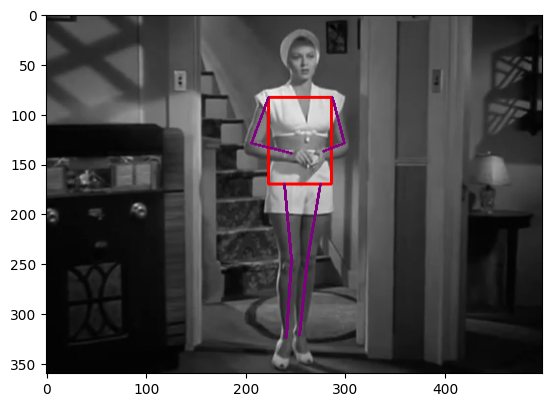

In [ ]:
########### LEGS ###########

#9: RHip
RHip =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['9'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['9'][1]) ]
#10: RKnee
RKnee =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['10'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['10'][1]) ]
#11: RAnkle
RAnkle =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['11'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['11'][1] )]

#12: LHip
LHip =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['12'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['12'][1]) ]
#13: LKnee
LKnee =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['13'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['13'][1] )]
#14: LAnkle
LAnkle =[int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['14'][0]), int(json_video_dict['frames']['600']["person_00"]['pose_kpts']['14'][1]) ]

### Draw the lines ####
# RHip --> RKnee
cv2.line(frame_600_temp, RHip, RKnee, (128, 0, 128), 2)
# RKnee --> RAnkle
cv2.line(frame_600_temp, RKnee, RAnkle, (128, 0, 128), 2)

# LHip --> LKnee
cv2.line(frame_600_temp, LHip, LKnee, (128, 0, 128), 2)
# LKnee --> LAnkle
cv2.line(frame_600_temp, LKnee, LAnkle, (128, 0, 128), 2)
plt.imshow(frame_600_temp)

Till now, we discovered the data and applied the following steps:

*   Extracted the video frames
*   Investigated the JSON file
*   Plotted the bounding box of the face and body
* Drew the lines of arms and legs

We can now combine all the steps and create a pipeline where all the steps above will be applied to each frame of the video.



# 2. Pipeline

In [ ]:
from google.colab.patches import cv2_imshow
import numpy as np
import cv2
from matplotlib import pyplot as plt
import json
import csv
import math


#############################################################################################################################################################



########## Plot Bounding box of face ###############
###############
def plot_bounding_box_of_face(video_frame, fr_number, person_number):

  #Function to draw bounding box of the face. It takes one frame as an input and
  #returns the x, y coordinates, width and height of the face.
  #
  #Arguments:
      #video_frame: One video frame to be processed
      #fr_number: The frame number of the input frame in the range [0,1864], since there are 1864 frames.
      #person_number: The person number in the image (either '00' or '11').

  #Return:
      #head_center_x: x-coordinate of the face
      #head_center_y: y-coordinate of the face
      #width_head: width of the face
      #height_head: height of the face


  input_frame = json_video_dict['frames'][str(fr_number)]['person_'+str(person_number)]['face_kpts']

  #Detect the x-y coordinates of the center of face. The value can be (-1) if there is no info for the face in JSON file.
  head_center_x = input_frame['33'][0] if input_frame['33'][0] != -1 else -1
  head_center_y = input_frame['33'][1] if input_frame['33'][1] != -1 else -1

  #Find the width of the face
  endmost_left_x = input_frame['0'][0] if input_frame['0'][0] != -1 else -1
  endmost_right_x = input_frame['16'][0] if input_frame['16'][0] != -1 else -1
  width_head = np.absolute(endmost_left_x - endmost_right_x)

  #Find the height of the face
  endmost_top_y = input_frame['24'][1] if input_frame['24'][1] != -1 else -1
  endmost_bottom_y = input_frame['8'][1] if input_frame['8'][1]  != -1 else -1
  height_head = np.absolute(endmost_top_y - endmost_bottom_y)

  if head_center_x != -1 and head_center_y != -1 and height_head != -1 and width_head != -1:
    # Start coordinate represents the top left corner of rectangle
    start_point = ( int(head_center_x - (width_head/2)) ,  int(head_center_y + (height_head/2) )  )
    # Ending coordinate represents the bottom right corner of rectangle
    end_point = ( int( head_center_x + (width_head/2)) , int( head_center_y - (height_head/2))   )

    cv2.rectangle(video_frame, start_point, end_point, color = (0, 255, 0), thickness=2)

  return head_center_x, head_center_y, width_head, height_head








########## Plot Bounding box of body ###############
###############
def plot_bounding_box_of_body(video_frame, fr_number, person_number):

  #Function to draw bounding box of the body. It takes one frame as an input and
  #returns the x, y coordinates, width and height of the body.
  #
  #Arguments:
      #video_frame: One video frame to be processed.
      #fr_number: The frame number of the input frame in the range [0,1864], since there are 1864 frames.
      #person_number: The person number in the image (either '00' or '11').

  #Return:
      #body_center_x: x-coordinate of the body.
      #body_center_y: y-coordinate of the body.
      #body_width: width of the body.
      #body_height: height of the body.

  input_frame = json_video_dict['frames'][str(fr_number)]['person_'+str(person_number)]['pose_kpts']

  #The keypoint #1 is at the center and we can use its x-coordinate as body center x-coordinate.
  body_center_x = input_frame['1'][0] if input_frame['1'][0] != -1 else -1

  #The body center y-coordinate is the half distance between y-coordinates of the the endmost top(#1) and endmost bottom(#8) points:
  body_endmost_top_y = input_frame['1'][1] if input_frame['1'][1] != -1 else -1
  body_endmost_bottom_y = input_frame['8'][1]  if input_frame['8'][1] != -1 else -1
  body_center_y = (body_endmost_top_y + body_endmost_bottom_y)/2 if (body_endmost_top_y != -1 and body_endmost_bottom_y != -1) else -1

  #body_height = int(np.absolute(body_endmost_bottom_y - body_endmost_top_y))
  body_height = np.absolute(body_endmost_bottom_y - body_endmost_top_y) if (body_endmost_bottom_y != -1 and body_endmost_top_y != -1) else -1

  #The body center y-coordinate is the half distance between y-coordinates of the the endmost top(#1) and endmost bottom(#8) points:
  body_endmost_right_x = input_frame['5'][0] if input_frame['5'][0] != -1 else -1
  body_endmost_left_x = input_frame['2'][0]  if input_frame['2'][0] != -1 else -1

  #body_width = int(np.absolute(body_endmost_right_x - body_endmost_left_x))
  body_width = np.absolute(body_endmost_right_x - body_endmost_left_x) if (body_endmost_right_x != -1 and body_endmost_left_x != -1) else -1

  if body_center_x != -1 and body_center_y != -1 and body_height != -1 and body_width != -1:
    # Start coordinate represents the top left corner of rectangle
    start_point = ( int(body_center_x - (body_width/2)) ,  int(body_center_y + (body_height/2) )  )
    # Ending coordinate represents the bottom right corner of rectangle
    end_point = ( int( body_center_x + (body_width/2)) , int( body_center_y - (body_height/2))   )

    cv2.rectangle(video_frame, start_point, end_point, color = (255, 0, 0), thickness=2)

  return body_center_x, body_center_y, body_width, body_height


####### Drawing the lines of the arms and legs #######
##############
def plot_arms_and_legs(video_frame, fr_number, person_number):

  #Function to draw lines box of the arms and legs. It takes one frame as an input and
  #returns the right_arm, left_arm, right_leg, left_leg coordinates.
  #
  #Arguments:
      #video_frame: One video frame to be processed.
      #fr_number: The frame number of the input frame in the range [0,1864], since there are 1864 frames.
      #person_number: The person number in the image (either '00' or '11').

  #Return:
      #right_arm = [RShoulder, RElbow, RWrist]: The coordinates of the RShoulder, RElbow, and RWrist.
      #left_arm = [LShoulder, LElbow, LWrist]: The coordinates of the LShoulder, LElbow, and LWrist
      #right_leg = [RHip, RKnee, RAnkle]: The coordinates of the RHip, RKnee, and RAnkle
      #left_leg = [LHip, LKnee, LAnkle]: The coordinates of the LHip, LKnee, and LAnkle.
      #These coordinates will be used in unit vector calculation later.

  input_frame = json_video_dict['frames'][str(fr_number)]['person_'+str(person_number)]['pose_kpts']

  ########### ARMS ####################################################################################
  #####################################################################################################
  #2: RShoulder
  RShoulder =[int(input_frame['2'][0]), int(input_frame['2'][1]) ]
  #3: RElbow
  RElbow =[int(input_frame['3'][0]), int(input_frame['3'][1]) ]
  #4: RWrist
  RWrist =[int(input_frame['4'][0]), int(input_frame['4'][1] )]

  #5: LShoulder
  LShoulder =[int(input_frame['5'][0]), int(input_frame['5'][1]) ]
  #6: LElbow
  LElbow =[int(input_frame['6'][0]), int(input_frame['6'][1] )]
  #7: LWrist
  LWrist =[int(input_frame['7'][0]), int(input_frame['7'][1]) ]

  ### Draw the lines ####
  # RShoulder --> RElbow
  if (RShoulder[0] != -1 and RShoulder[1] != -1 and RElbow[0] != -1 and RElbow[1] != -1):
    cv2.line(video_frame, RShoulder, RElbow, (128, 0, 128), 2)
  # RElbow --> RWrist
  if (RElbow[0] != -1 and RElbow[1] != -1 and RWrist[0] != -1 and RWrist[1] != -1):
    cv2.line(video_frame, RElbow, RWrist, (128, 0, 128), 2)

  # LShoulder --> LElbow
  if (LShoulder[0] != -1 and LShoulder[1] != -1 and LElbow[0] != -1 and LElbow[1] != -1):
    cv2.line(video_frame, LShoulder, LElbow, (128, 0, 128), 2)
  # LElbow --> LWrist
  if (LElbow[0] != -1 and LElbow[1] != -1 and LWrist[0] != -1 and LWrist[1] != -1):
    cv2.line(video_frame, LElbow, LWrist, (128, 0, 128), 2)

  #####################################################################################################
  #####################################################################################################

  ########### LEGS ###########
  #9: RHip
  RHip =[int(input_frame['9'][0]), int(input_frame['9'][1]) ]
  #10: RKnee
  RKnee =[int(input_frame['10'][0]), int(input_frame['10'][1]) ]
  #11: RAnkle
  RAnkle =[int(input_frame['11'][0]), int(input_frame['11'][1] )]

  #12: LHip
  LHip =[int(input_frame['12'][0]), int(input_frame['12'][1]) ]
  #13: LKnee
  LKnee =[int(input_frame['13'][0]), int(input_frame['13'][1] )]
  #14: LAnkle
  LAnkle =[int(input_frame['14'][0]), int(input_frame['14'][1]) ]

  ### Draw the lines ####
  # RHip --> RKnee
  if (RHip[0] != -1 and RHip[1] != -1 and RKnee[0] != -1 and RKnee[1] != -1):
    cv2.line(video_frame, RHip, RKnee, (128, 0, 128), 2)
  # RKnee --> RAnkle
  if (RKnee[0] != -1 and RKnee[1] != -1 and RAnkle[0] != -1 and RAnkle[1] != -1):
    cv2.line(video_frame, RKnee, RAnkle, (128, 0, 128), 2)

  # LHip --> LKnee
  if (LHip[0] != -1 and LHip[1] != -1 and LKnee[0] != -1 and LKnee[1] != -1):
    cv2.line(video_frame, LHip, LKnee, (128, 0, 128), 2)
  # LKnee --> LAnkle
  if (LKnee[0] != -1 and LKnee[1] != -1 and LAnkle[0] != -1 and LAnkle[1] != -1):
    cv2.line(video_frame, LKnee, LAnkle, (128, 0, 128), 2)

  #Before return elements, collect the left and right body parts in lists.
  right_arm = [RShoulder, RElbow, RWrist]
  left_arm = [LShoulder, LElbow, LWrist]
  right_leg = [RHip, RKnee, RAnkle]
  left_leg = [LHip, LKnee, LAnkle]

  return right_arm, left_arm, right_leg, left_leg



def calculate_unit_vector(point1, point2):
  #Function to calculate unit vector from point1 to point2.
  #
  #Arguments:
      #point1, and point2

  #Return: Unit vector coordinates, and its length.

    x1, y1 = point1[0], point1[1]
    x2, y2 = point2[0], point2[1]

    if (x1 != -1 and x2 != -1 and y1 != -1 and y2 != -1):
      #The direction is from point1 to point2
      distance = [x2 - x1, y2 - y1]
      norm = math.sqrt(distance[0] ** 2 + distance[1] ** 2)
      unit_vector = [(distance[0] / norm), (distance[1] / norm)]

      length = math.sqrt((distance[0])**2 + (distance[1])**2)

      return unit_vector[0],unit_vector[1], length

    else:
      return -1, -1, 0


#############################################################################################################################################################
#############################################################################################################################################################
#############################################################################################################################################################






def Draw_lines_and_bounding_boxes(video_frames, json_video_dict):
  #Function to draw lines and bounding boxes as well as create output CSV file.
  #
  #Arguments:
      #video_frames: video frames in a list (in our case len=1864).
      #json_video_dict: JSON file that have the information of coordinates of key points of face and pose.
  #
  #return:
      #video_frames: Video frames list after the drawing.



  #Before drawing bounding boxes and lines, we create a .csv file to store all the information.
  f = open('OUTPUT_csv_file.csv', 'w', newline='')
  csv_writer = csv.writer(f)
  columns = ['frame_ID','person_ID','head_center_x','head_center_y','head_width','head_height','body_center_x','body_center_y','body_width','body_height','left_shoulder_x','left_shoulder_y','left_shoulder_vec_x','left_shoulder_vec_y','left_upper_arm_length','left_elbow_vec_x','left_elbow_vec_y','left_lower_arm_length','right_shoulder_x','right_shoulder_y','right_shoulder_vec_x','right_shoulder_vec_y','right_upper_arm_length','right_elbow_vec_x','right_elbow_vec_y','right_lower_arm_length','left_hip_x','left_hip_y','left_hip_vec_x','left_hip_vec_y','left_upper_leg_length','left_knee_vec_x','left_knee_vec_y','left_lower_leg_length','right_hip_x','right_hip_y','right_hip_vec_x','right_hip_vec_y','right_upper_leg_length','right_knee_vec_x','right_knee_vec_y','right_lower_leg_length']

  with open('csv_file1.csv', 'w', newline='') as f:
    csv_writer.writerow(columns)

  ################################################################
  #### Now we can draw the bounding boxes and lines for each frame:
  for fr in range(len(video_frames)):
    print("fr = ", fr)

    person_per_frame = len(json_video_dict['frames'][str(fr)])

    for person in range(person_per_frame):
      if person < 10:
        person_number = '0' + str(person)

      #Plot bounding box of face
      head_center_x, head_center_y, width_head, height_head = plot_bounding_box_of_face(video_frames[fr], fr, person_number)
      #Plot bounding box of body
      body_center_x, body_center_y, body_width, body_height = plot_bounding_box_of_body(video_frames[fr], fr, person_number)
      #Draw arms and legs
      right_arm, left_arm, right_leg, left_leg = plot_arms_and_legs(video_frames[fr], fr, person_number)

      ###### Just to remember what was returned: #######
      #right_arm = [RShoulder, RElbow, RWrist]
      #left_arm = [LShoulder, LElbow, LWrist]
      #right_leg = [RHip, RKnee, RAnkle]
      #left_leg = [LHip, LKnee, LAnkle]

      #Calculate the unit vector for Arms:
      right_shoulder_vec_x, right_shoulder_vec_y, right_upper_arm_length = calculate_unit_vector(right_arm[0], right_arm[1])
      right_elbow_vec_x, right_elbow_vec_y, right_lower_arm_length = calculate_unit_vector(right_arm[1], right_arm[2])

      left_shoulder_vec_x, left_shoulder_vec_y, left_upper_arm_length  = calculate_unit_vector(left_arm[0], left_arm[1])
      left_elbow_vec_x, left_elbow_vec_y, left_lower_arm_length = calculate_unit_vector(left_arm[1], left_arm[2])

      #Calculate the unit vector for Legs:
      right_hip_vec_x, right_hip_vec_y, right_upper_leg_length = calculate_unit_vector(right_leg[0], right_leg[1])
      right_knee_vec_x, right_knee_vec_y, right_lower_leg_length = calculate_unit_vector(right_leg[1], right_leg[2])

      left_hip_vec_x, left_hip_vec_y, left_upper_leg_length = calculate_unit_vector(left_leg[0], left_leg[1])
      left_knee_vec_x, left_knee_vec_y, left_lower_leg_length = calculate_unit_vector(left_leg[1], left_leg[2])


      # Create a row for the .csv file:
      row = [str(fr),"person_"+ person_number,

            #head
            str(head_center_x), str(head_center_y), str(width_head), str(height_head),
            #body
            str(body_center_x), str(body_center_y), str(body_width), str(body_height),

            #Left arm
            str(left_arm[0][0]), str(left_arm[0][1]), str(left_shoulder_vec_x),str(left_shoulder_vec_y),str(left_upper_arm_length),
            str(left_elbow_vec_x), str(left_elbow_vec_y), str(left_lower_arm_length),
            #Right arm
            str(right_arm[0][0]), str(right_arm[0][1]), str(right_shoulder_vec_x), str(right_shoulder_vec_y), str(right_upper_arm_length),
            str(right_elbow_vec_x), str(right_elbow_vec_y), str(right_lower_arm_length),

            #Left leg
            str(left_leg[0][0]), str(left_leg[0][1]), str(left_hip_vec_x), str(left_hip_vec_y), str(left_upper_leg_length),str(left_knee_vec_x),
            str(left_knee_vec_y), str(left_lower_leg_length),

            #Right leg
            str(right_leg[0][0]), str(right_leg[0][1]),str(right_hip_vec_x), str(right_hip_vec_y), str(right_upper_leg_length),str(right_knee_vec_x),
            str(right_knee_vec_y), str(right_lower_leg_length)

            ]

      #Write row to the csv file
      csv_writer.writerow(row)

    #plt.imshow(video_frames[fr])
    #break


    #I am saving each frame after drawing bounding boxes and lines into a folder called 'final_frames'.
    #I will use these frames later to create a video.
    cv2.imwrite(f'/content/drive/MyDrive/Prof-Lucile-Sassatelli-project/final_frames/frame_{fr}.jpg', video_frames[fr])


  #close the csv file
  f.close()
  return video_frames


################################################################################################################################
################################################################################################################################
################################################################################################################################

#Extract video frames:
path_to_video = "/content/drive/MyDrive/Prof-Lucile-Sassatelli-project/clip_05.mp4"
video_frames_jpg = extract_frames(path_to_video)

#Read the JSON file:
path_to_json_file = "/content/drive/MyDrive/Prof-Lucile-Sassatelli-project/clip_05_pose.json"
json_video_clip = open(path_to_json_file)
json_video_dict = json.load(json_video_clip)


video_frames_jpg_copy = video_frames_jpg.copy()

#Draw lines and bounding boxes + create CSV file
video_frames = Draw_lines_and_bounding_boxes(video_frames_jpg_copy, json_video_dict)


Extracting video frames...
fr =  0
fr =  1
fr =  2
fr =  3
fr =  4
fr =  5
fr =  6
fr =  7
fr =  8
fr =  9
fr =  10
fr =  11
fr =  12
fr =  13
fr =  14
fr =  15
fr =  16
fr =  17
fr =  18
fr =  19
fr =  20
fr =  21
fr =  22
fr =  23
fr =  24
fr =  25
fr =  26
fr =  27
fr =  28
fr =  29
fr =  30
fr =  31
fr =  32
fr =  33
fr =  34
fr =  35
fr =  36
fr =  37
fr =  38
fr =  39
fr =  40
fr =  41
fr =  42
fr =  43
fr =  44
fr =  45
fr =  46
fr =  47
fr =  48
fr =  49
fr =  50
fr =  51
fr =  52
fr =  53
fr =  54
fr =  55
fr =  56
fr =  57
fr =  58
fr =  59
fr =  60
fr =  61
fr =  62
fr =  63
fr =  64
fr =  65
fr =  66
fr =  67
fr =  68
fr =  69
fr =  70
fr =  71
fr =  72
fr =  73
fr =  74
fr =  75
fr =  76
fr =  77
fr =  78
fr =  79
fr =  80
fr =  81
fr =  82
fr =  83
fr =  84
fr =  85
fr =  86
fr =  87
fr =  88
fr =  89
fr =  90
fr =  91
fr =  92
fr =  93
fr =  94
fr =  95
fr =  96
fr =  97
fr =  98
fr =  99
fr =  100
fr =  101
fr =  102
fr =  103
fr =  104
fr =  105
fr =  106
fr =  107
fr 

The output CSV file (OUTPUT_csv_file.csv) will be saved in your local.

# 3. Create a video from Frames

In this section, we create a AVI format video from the final JPG format frames and display it.

In [ ]:
import cv2
import numpy as np
import glob

path_to_saved_jpg_images = '/content/drive/MyDrive/Prof-Lucile-Sassatelli-project/final_frames/*.jpg'
img_array = []
for filename in glob.glob(path_to_saved_jpg_images):
    img = cv2.imread(filename)
    height, width, layers = img.shape
    size = (width,height)
    img_array.append(img)


out = cv2.VideoWriter('project.avi',cv2.VideoWriter_fourcc(*'DIVX'), 15, size)

for i in range(len(img_array)):
    out.write(img_array[i])
out.release()

Display the video.

In [ ]:
from moviepy.editor import *

path="project.avi"

clip=VideoFileClip(path)
clip.ipython_display(width=498, maxduration= 224.3)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



t:  99%|█████████▊| 1839/1865 [00:07<00:00, 257.21it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file project.avi, 537840 bytes wanted but 0 bytes read,at frame 1864/1865, at time 124.27/124.27 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4


The output video name is "project.avi". (I converted it to MP4 format using free online converters on the internet. I used this website: https://www.veed.io/tools/video-editor/avi-video-editor)